In [1]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pyvips
import glob

# Params
sample_n = 8
min_sample_n = 0

# Paths
root = '/media/latlab/MR/projects/kaggle-ubc-ocean'
data_dir = os.path.join(root, 'data')
results_dir = os.path.join(root, 'results')
train_csv = 'train.csv'
train_image_dir = os.path.join(data_dir, 'train_images')
train_thumbnail_dir = os.path.join(data_dir, 'train_thumbnails')
train_mask_dir = os.path.join(data_dir, 'train_masks')
tile_set_name = 'tumor_detection_tiles_2048_p25_drop60'
tiles_dir = os.path.join(results_dir, tile_set_name)

if min_sample_n > 0:
    out_name = f'{tile_set_name}_minsample{min_sample_n}'
else:
    out_name = tile_set_name

# Load data
df = pd.read_csv(os.path.join(data_dir, train_csv))

# Get only images with masks
mask_id_list = [int(os.path.splitext(os.path.basename(mask_path))[0]) for mask_path in glob.glob(os.path.join(train_mask_dir, '*.png'))]
df = df[df['image_id'].isin(mask_id_list)].reset_index(drop=True)
df

,image_id,label,image_width,image_height,is_tma
0,66,LGSC,48871,48195,False
1,1020,HGSC,36585,33751,False
2,1101,HGSC,26306,18403,False
3,1252,HGSC,60420,27480,False
4,1925,HGSC,44847,32951,False
...,...,...,...,...,...
147,63165,CC,30342,12783,False
148,63941,HGSC,47123,36600,False
149,65022,LGSC,53355,46675,False
150,65094,MC,55042,45080,False


In [2]:
tiles_df = pd.DataFrame(columns=['image_id', 'orig_image_id', 'label', 'is_tma'])
for i, row in df.iterrows():
    orig_image_id = row['image_id']
    try:
        image_id_list = [os.path.splitext(x)[0] for x in os.listdir(os.path.join(tiles_dir, str(orig_image_id))) if x.endswith('.png')]

        # Load labels
        labels_path = os.path.join(tiles_dir, str(orig_image_id), 'labels.csv')
        labels_df = pd.read_csv(labels_path).set_index('image_id')
        labels_df = labels_df.loc[image_id_list,:]
        
        curr_df = pd.DataFrame({'image_id': image_id_list, 
                                'orig_image_id': orig_image_id, 
                                'label': row['label'], 
                                'orig_image_width': row['image_width'], 
                                'orig_image_height': row['image_height'], 
                                'is_tma': row['is_tma'],
                                'tumor': labels_df['tumor'],
                                'stroma': labels_df['stroma'],
                                'necrosis': labels_df['necrosis'],
                                'background': labels_df['background']})
        tiles_df = pd.concat((tiles_df, curr_df))
    except:
        print(f'No tiles for {orig_image_id}')
tiles_df = tiles_df.reset_index(drop=True).astype({'orig_image_width': 'int32', 'orig_image_height': 'int32'})
tiles_df['is_tumor'] = tiles_df['tumor'] > 0.95
tiles_df['not_tumor'] = (tiles_df['stroma'] > 0.5) & (tiles_df['tumor'] < 0.05)
tiles_df = tiles_df[tiles_df['is_tumor'] | tiles_df['not_tumor']]
tiles_df

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height,tumor,stroma,necrosis,background,is_tumor,not_tumor
2,000057_10-3,66,LGSC,False,48871,48195,0.973664,0.000000,0.0,0.026336,True,False
8,000398_15-17,66,LGSC,False,48871,48195,0.988068,0.000000,0.0,0.011932,True,False
9,000226_11-10,66,LGSC,False,48871,48195,1.000000,0.000000,0.0,0.000000,True,False
23,000253_14-11,66,LGSC,False,48871,48195,1.000000,0.000000,0.0,0.000000,True,False
34,000488_9-21,66,LGSC,False,48871,48195,0.972127,0.000000,0.0,0.027873,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...
40196,000167_7-8,65533,HGSC,False,45190,33980,1.000000,0.000000,0.0,0.000000,True,False
40213,000259_7-12,65533,HGSC,False,45190,33980,0.960735,0.000000,0.0,0.039265,True,False
40232,000246_17-11,65533,HGSC,False,45190,33980,0.000000,0.992098,0.0,0.007902,False,True
40239,000265_13-12,65533,HGSC,False,45190,33980,0.000000,1.000000,0.0,0.000000,False,True


In [3]:
tiles_df.to_csv(os.path.join(results_dir, f'{out_name}.csv'), index=False)

In [4]:
# Undersample to N tile/image
def sampler(x, n):
    if len(x) < n:
        return x
    else:
        return x.sample(n)
tiles_df_sample = tiles_df.groupby('orig_image_id').apply(lambda x: sampler(x, sample_n)).reset_index(drop=True)
tiles_df_sample.to_csv(os.path.join(results_dir, f'{out_name}_sample{sample_n}.csv'), index=False)
display(tiles_df_sample)
print('tumor tiles ratio:', tiles_df_sample['is_tumor'].mean())

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height,tumor,stroma,necrosis,background,is_tumor,not_tumor
0,000398_15-17,66,LGSC,False,48871,48195,0.988068,0.000000,0.0,0.011932,True,False
1,000352_17-15,66,LGSC,False,48871,48195,0.960212,0.000000,0.0,0.039788,True,False
2,000203_12-9,66,LGSC,False,48871,48195,1.000000,0.000000,0.0,0.000000,True,False
3,000489_10-21,66,LGSC,False,48871,48195,0.992167,0.000000,0.0,0.007833,True,False
4,000205_14-9,66,LGSC,False,48871,48195,1.000000,0.000000,0.0,0.000000,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...
1008,000167_7-8,65533,HGSC,False,45190,33980,1.000000,0.000000,0.0,0.000000,True,False
1009,000166_6-8,65533,HGSC,False,45190,33980,1.000000,0.000000,0.0,0.000000,True,False
1010,000269_17-12,65533,HGSC,False,45190,33980,0.000000,0.927694,0.0,0.072306,False,True
1011,000288_13-13,65533,HGSC,False,45190,33980,0.000000,0.682537,0.0,0.317463,False,True


tumor tiles ratio: 0.792694965449161


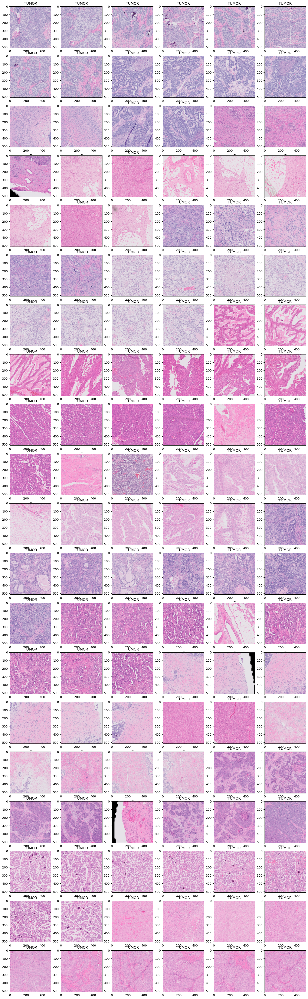

In [8]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tiles_df_sample.iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    # img = plt.imread(img_path)
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title('TUMOR' if row['is_tumor'] else '_')
    ax.imshow(img)